In [2]:
import pandas as pd
import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import plotly.express as px
%matplotlib inline

/tmp/ipykernel_712886/1991343199.py:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
df = pd.read_excel('.././data/baza_zanonimizowana.xlsx')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   NEW IDENTIFIER                 416 non-null    object 
 1   wiek                           405 non-null    float64
 2   PSA                            401 non-null    float64
 3   data operacji                  404 non-null    object 
 4   PSAdensity                     402 non-null    float64
 5   Prostate vol                   0 non-null      float64
 6   DRE                            0 non-null      float64
 7   MRI vol                        402 non-null    float64
 8   MRI Pirads                     402 non-null    float64
 9   lokalizacja                    37 non-null     object 
 10  MRI EPE (naciek poza torebke)  403 non-null    float64
 11  MRI EPE L                      404 non-null    float64
 12  MRI EPE P                      404 non-null    flo

In [4]:
df[['% P', 'ilość\xa0+ wycinków P', '% L', 'Ilość + wycinków L']]

,% P,ilość + wycinków P,% L,Ilość + wycinków L
0,40.0,2na4,20.0,1na5
1,20.0,1na5 20% fuzja 2na3 10%,80.0,"0na4, 3 na 3"
2,0.0,0na7,45.0,6na7
3,80.0,NaN,75.0,NaN
4,100.0,NaN,0.0,NaN
...,...,...,...,...
411,NaN,NaN,NaN,NaN
412,NaN,NaN,NaN,NaN
413,NaN,NaN,NaN,NaN
414,NaN,NaN,NaN,NaN


In [5]:
non_missing_count_df = pd.DataFrame(len(df) - df.isna().sum()).reset_index().rename(columns={'index': 'column', 0: 'non_missing_count'})
low_values_cols = non_missing_count_df[non_missing_count_df['non_missing_count'] < len(df)* 0.15]["column"].tolist()
low_values_cols

['Prostate vol ',
 'DRE',
 'lokalizacja',
 '% P',
 'ilość\xa0+ wycinków P',
 '% L',
 'Ilość + wycinków L',
 'Kolumna2',
 'Kolumna3']

In [6]:
cols_to_drop = ['Prostate vol ',
 'DRE',
 'lokalizacja',
 'Kolumna2',
 'Kolumna3']
# these are cols which makes sense to drop initially

In [7]:
reduced_df = df.drop(columns=cols_to_drop)
reduced_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   NEW IDENTIFIER                 416 non-null    object 
 1   wiek                           405 non-null    float64
 2   PSA                            401 non-null    float64
 3   data operacji                  404 non-null    object 
 4   PSAdensity                     402 non-null    float64
 5   MRI vol                        402 non-null    float64
 6   MRI Pirads                     402 non-null    float64
 7   MRI EPE (naciek poza torebke)  403 non-null    float64
 8   MRI EPE L                      404 non-null    float64
 9   MRI EPE P                      404 non-null    float64
 10  MRI SVI (pecherzyki)           404 non-null    float64
 11  MRI SVI L                      403 non-null    float64
 12  MRI SVI P                      404 non-null    flo

In [8]:
# reduced_df.dropna(axis=0, inplace=True)
# reduced_df.info()

In [9]:
reduced_df['data operacji'].unique()

array([nan, 'luty.21', 'marzec.21', datetime.datetime(2018, 1, 1, 0, 0),
       datetime.datetime(2016, 10, 1, 0, 0),
       datetime.datetime(2017, 5, 1, 0, 0),
       datetime.datetime(2019, 1, 1, 0, 0),
       datetime.datetime(2019, 9, 1, 0, 0), 'paz.17',
       datetime.datetime(2018, 12, 1, 0, 0),
       datetime.datetime(2016, 4, 1, 0, 0),
       datetime.datetime(2016, 11, 1, 0, 0),
       datetime.datetime(2015, 9, 1, 0, 0),
       datetime.datetime(2015, 11, 1, 0, 0),
       datetime.datetime(2018, 5, 1, 0, 0),
       datetime.datetime(2020, 9, 1, 0, 0),
       datetime.datetime(2018, 3, 1, 0, 0),
       datetime.datetime(2017, 2, 1, 0, 0),
       datetime.datetime(2018, 7, 1, 0, 0),
       datetime.datetime(2017, 4, 5, 0, 0),
       datetime.datetime(2017, 7, 1, 0, 0),
       datetime.datetime(2016, 6, 1, 0, 0),
       datetime.datetime(2017, 8, 1, 0, 0),
       datetime.datetime(2017, 1, 1, 0, 0),
       datetime.datetime(2018, 10, 1, 0, 0),
       datetime.datetime(2018, 4

In [10]:
reduced_df['data operacji'] = reduced_df['data operacji'].replace({
    'paz.17': datetime.datetime(2017, 10, 1, 0, 0),
    'luty.21': datetime.datetime(2021, 2, 1, 0, 0),
    'marzec.21': datetime.datetime(2021, 3, 1, 0, 0)
})
reduced_df['data operacji']

/tmp/ipykernel_712886/419479809.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  reduced_df['data operacji'] = reduced_df['data operacji'].replace({


0            NaT
1     2021-02-01
2     2021-03-01
3     2018-01-01
4     2016-10-01
         ...    
411          NaT
412   2018-03-01
413          NaT
414   2018-03-01
415          NaT
Name: data operacji, Length: 416, dtype: datetime64[ns]

In [11]:
reduced_df["operation_year"] = reduced_df['data operacji'].dt.year
reduced_df["operation_month"] = reduced_df['data operacji'].dt.month
reduced_df

,NEW IDENTIFIER,wiek,PSA,data operacji,PSAdensity,MRI vol,MRI Pirads,MRI EPE (naciek poza torebke),MRI EPE L,MRI EPE P,...,N +,EPE RP,EPE L RP,EPE P RP,SVI RP,SVI RP L,SVI RP P,TNM,operation_year,operation_month
0,ID00000,63.0,5.11,NaT,0.146000,35.0,4.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,t2,NaN,NaN
1,ID00008,64.0,5.39,2021-02-01,0.179667,30.0,3.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,t3a,2021.0,2.0
2,ID00049,64.0,8.30,2021-03-01,0.207500,40.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,t2c,2021.0,3.0
3,ID00285,64.0,17.10,2018-01-01,0.289831,59.0,5.0,1.0,1.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,t4,2018.0,1.0
4,ID00001,56.0,6.80,2016-10-01,0.200000,34.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pt2c,2016.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,ID00262,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
412,ID00263,59.0,1.93,2018-03-01,0.055143,35.0,4.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,t3a,2018.0,3.0
413,ID00173,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
414,ID00035,60.0,17.70,2018-03-01,0.453846,39.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,t2c,2018.0,3.0


In [12]:
ProfileReport(reduced_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 34/34 [00:00<00:00, 53.25it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

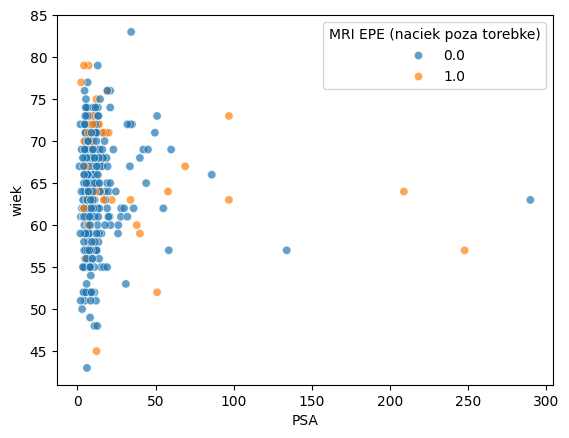

In [13]:
sns.scatterplot(data=reduced_df, x='PSA', y='wiek', hue='MRI EPE (naciek poza torebke)', alpha=0.7)
plt.show()

In [14]:
px.histogram(reduced_df, x='PSA', nbins=60)
for col in reduced_df.columns:
    # temp_df = reduced_df[col].fillna('NaN')
    fig = px.histogram(reduced_df, x=col, nbins=60)
    fig.update_layout(title=f"{col} distribution")
    fig.show()

In [24]:
px.imshow(reduced_df.select_dtypes(include=['int64', 'float64']).corr(), text_auto=True, width=900, height=700)

In [ ]:
#checking the correlation of EPE after prostatectomy and EPE detection on MRI imaging
reduced_df[['EPE RP', 'MRI EPE (naciek poza torebke)']].dropna(axis=0).corr()

,EPE RP,MRI EPE (naciek poza torebke)
EPE RP,1.000000,0.168431
MRI EPE (naciek poza torebke),0.168431,1.000000
